# Installing Detectron2 and Dependencies

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html


# Imports and setup

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
# setting random seed for numpy and torch
RANDOM_SEED = 99
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

In [ ]:
project_dir = 'drive/My Drive/airbus-ship-detection'
experiment_id = '20201011'

# Importing the data

The original ground truth values for the ship detection challenge were provided in a CSV file that contains only two columns.  One column contains the file name and the other column contains a string of space separated numerical values that represent a run length encoding of a mask that would encompass all of the pixels of a single ship in the image.  In the case of multiple ships in a single image, there are multiple entries with the same file name.

Separate from this notebook, I had used the data from that CSV file to generate a JSON file with data formatted in a more useful way for my approach.  This JSON file most notably contains two new pieces of information: first the file path to the image, and second the bounding box values for the ships.

In [ ]:
# the ground truth values are brought in with this json file
with open(os.path.join(project_dir,'all_files_info.json')) as fp:
  list_of_dicts = json.load(fp)

In [ ]:
# total number of image files
len(list_of_dicts)

192556

# Dividing the data

In [ ]:
# I decided to discard the images without ships in them.  There are still over 40k images to work with.
without_ships_list = []
with_ships_list = []

for img in list_of_dicts:
  if img['has_ship'] == True:
    with_ships_list.append(img)
  elif img['has_ship'] == False:
    without_ships_list.append(img)

In [ ]:
print(len(with_ships_list))
print(len(without_ships_list))

42556
150000


In [ ]:
# I took the first 3000 images for testing purposes.  I didn't see any evidence that the images 
# were ordered in any way, so I don't think that this should be an issue.
test_imgs = with_ships_list[:3000]
# Training and validation images were shuffled for randomness, but may not need it.
np.random.shuffle(with_ships_list[:3000])
val_imgs = with_ships_list[:6000]
train_imgs = with_ships_list[6000:]

In [ ]:
print(len(train_imgs))
print(len(val_imgs))
print(len(test_imgs))

36556
6000
3000


# Creating and registering the Detectron2 datasets

In [ ]:
# function for generating a single detectron2 style dataset dictionary from a single 
# value from the JSON ground truth file.  This is just for the purpose of using the visualizer.
from detectron2.structures import BoxMode

def create_dataset_dict(img_dict):
  dataset_dict = {}
  img_height = 768
  img_width = 768

  dataset_dict['image_id'] = img_dict['file']
  dataset_dict['file_name'] = img_dict['path']
  dataset_dict['height'] = img_height
  dataset_dict['width'] = img_width

  annotations = []
  if img_dict['coco_encodings'] is not None:
    for idx in range(len(img_dict['coco_encodings'])):

      new_anno = {}
      new_anno['category_id'] = 0
      new_anno['bbox_mode'] = BoxMode.XYXY_ABS
      new_anno['bbox'] = img_dict['bounding_boxes'][idx]
      annotations.append(new_anno)
  dataset_dict['annotations'] = annotations
  return dataset_dict

In [ ]:
# shortcut function for using the detectron2 visualizer
def visualize_img(dataset_dict, metadata, scale=0.5):
  print(dataset_dict['file_name'])
  print('loading image...')
  img = cv2.imread(dataset_dict['file_name'])
  print('initializing visualizer...')
  visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=scale)
  print('drawing dataset dict...')
  out = visualizer.draw_dataset_dict(dataset_dict)
  print('displaying image...')
  cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
# function for generating the training dataset
from detectron2.structures import BoxMode

def get_ship_dicts_train():
  data = train_imgs

  records = []
  img_height = 768
  img_width = 768

  for img in data:
    record = {}
    record['image_id'] = img['file']
    record['file_name'] = img['path']
    record['height'] = img_height
    record['width'] = img_width
    annotations = []
    if img['coco_encodings'] is not None:
      for idx in range(len(img['coco_encodings'])):
        new_anno = {}
        new_anno['category_id'] = 0
        new_anno['bbox_mode'] = BoxMode.XYXY_ABS
        new_anno['bbox'] = img['bounding_boxes'][idx]
        annotations.append(new_anno)
    record['annotations'] = annotations
    records.append(record)

  return records

In [ ]:
# function for generating the testing/validation dataset
from detectron2.structures import BoxMode

def get_ship_dicts_val():
  data = val_imgs

  records = []
  img_height = 768
  img_width = 768

  for img in data:
    record = {}
    record['image_id'] = img['file']
    record['file_name'] = img['path']
    record['height'] = img_height
    record['width'] = img_width
    annotations = []
    if img['coco_encodings'] is not None:
      for idx in range(len(img['coco_encodings'])):
        new_anno = {}
        new_anno['category_id'] = 0
        new_anno['bbox_mode'] = BoxMode.XYXY_ABS
        new_anno['bbox'] = img['bounding_boxes'][idx]
        annotations.append(new_anno)
    record['annotations'] = annotations
    records.append(record)

  return records

In [ ]:
# registering datasets and metadata
DatasetCatalog.register(name='airbus_ships_train_dataset', func=get_ship_dicts_train)
DatasetCatalog.register(name='airbus_ships_val_dataset', func=get_ship_dicts_val)
MetadataCatalog.get('airbus_ships_train_dataset').thing_classes = ['ship']
MetadataCatalog.get('airbus_ships_val_dataset').set(thing_classes=['ship'])
ship_metadata = MetadataCatalog.get('airbus_ships_train_dataset')

drive/My Drive/airbus-ship-detection/train_v2/188/89983c0a2.jpg
loading image...
initializing visualizer...
drawing dataset dict...
displaying image...


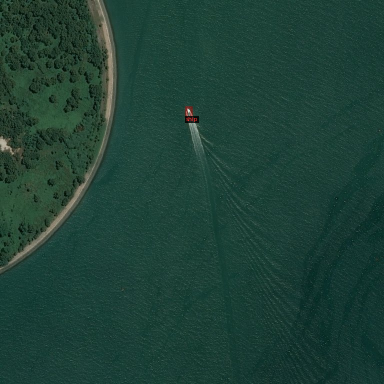

drive/My Drive/airbus-ship-detection/train_v2/124/f5403d69d.jpg
loading image...
initializing visualizer...
drawing dataset dict...
displaying image...


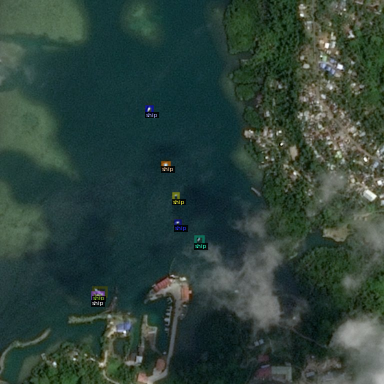

drive/My Drive/airbus-ship-detection/train_v2/053/2e8db8043.jpg
loading image...
initializing visualizer...
drawing dataset dict...
displaying image...


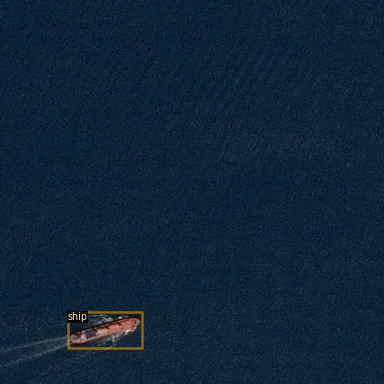

In [ ]:
# check that the dataset is working by visualizing some random images
random_imgs = random.sample(get_ship_dicts_train(), 3)
for d in random_imgs:
  visualize_img(d, ship_metadata)

# Getting the trainer ready

In [ ]:
# create folders for output
trainer_output_dir = os.path.join(project_dir, 'output', experiment_id)
evaluator_output_dir = os.path.join(project_dir, 'eval', experiment_id)
os.makedirs(trainer_output_dir, exist_ok=True)
os.makedirs(evaluator_output_dir, exist_ok=True)

In [ ]:
# custom trainer to make use of the COCO evaluator automatically
class ShipTrainer(DefaultTrainer):
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=evaluator_output_dir):
    if output_folder is None:
      os.makedirs('eval', exist_ok=True)
      output_folder = 'eval'

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
# configuration values
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ('airbus_ships_train_dataset',)
cfg.DATASETS.TEST = ('airbus_ships_val_dataset',)
cfg.DATALOADER.NUM_WORKERS = 4
# cfg.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001 
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = (50000)
cfg.SOLVER.CHECKPOINT_PERIOD = 2000
cfg.SOLVER.STEPS = (10000, 20000, 30000, 40000)
cfg.SOLVER.GAMMA = 0.1
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (512)   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ship)
cfg.TEST.EVAL_PERIOD = 2000
cfg.CUDNN_BENCHMARK = True
cfg.OUTPUT_DIR = trainer_output_dir

# Training the model

In [ ]:
trainer = ShipTrainer(cfg)

[10/12 01:11:11 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [ ]:
trainer.resume_or_load(resume=True)
trainer.train()

[10/12 01:11:53 d2.engine.train_loop]: Starting training from iteration 46000


/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


[10/12 01:13:27 d2.utils.events]:  eta: 3:19:14  iter: 46019  total_loss: 0.132  loss_cls: 0.031  loss_box_reg: 0.069  loss_rpn_cls: 0.004  loss_rpn_loc: 0.019  time: 3.4672  data_time: 3.4037  lr: 0.000000  max_mem: 7200M
[10/12 01:13:54 d2.utils.events]:  eta: 1:29:05  iter: 46039  total_loss: 0.213  loss_cls: 0.046  loss_box_reg: 0.088  loss_rpn_cls: 0.006  loss_rpn_loc: 0.049  time: 2.3276  data_time: 0.0103  lr: 0.000000  max_mem: 7200M
[10/12 01:14:19 d2.utils.events]:  eta: 1:28:33  iter: 46059  total_loss: 0.158  loss_cls: 0.035  loss_box_reg: 0.075  loss_rpn_cls: 0.005  loss_rpn_loc: 0.030  time: 1.9659  data_time: 0.0106  lr: 0.000000  max_mem: 7200M
[10/12 01:14:45 d2.utils.events]:  eta: 1:28:04  iter: 46079  total_loss: 0.147  loss_cls: 0.036  loss_box_reg: 0.071  loss_rpn_cls: 0.004  loss_rpn_loc: 0.035  time: 1.7932  data_time: 0.0100  lr: 0.000000  max_mem: 7200M
[10/12 01:15:11 d2.utils.events]:  eta: 1:27:37  iter: 46099  total_loss: 0.162  loss_cls: 0.036  loss_box_r

# Evaluation

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir drive/'My Drive'/airbus-ship-detection/output/20201011

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

initializing visualizer...
drawing instance predictions...
displaying image...


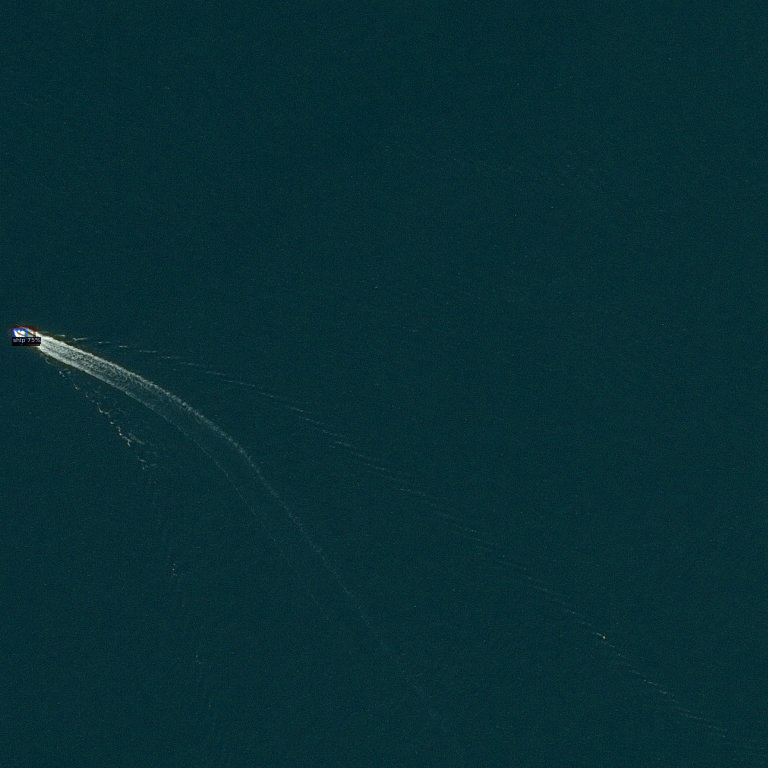

In [ ]:
from detectron2.utils.visualizer import ColorMode
test_img = test_imgs[800]['path']
# predictor = DefaultPredictor(cfg)
img = cv2.imread(test_img)
output = predictor(img)
# print(output)
print('initializing visualizer...')
"""
v = Visualizer(img[:, :, ::-1],
                   metadata=ship_metadata, 
                   scale=1.0, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
"""
v = Visualizer(img[:, :, ::-1], metadata=ship_metadata, scale=1.0)
print('drawing instance predictions...')
out = v.draw_instance_predictions(output['instances'].to('cpu'))
print('displaying image...')
cv2_imshow(out.get_image()[:, :, ::-1])